## Import necessary libraries and configuration of database

In [1]:
# For dataframe
import pandas as pd
import numpy as np
from sqlalchemy import create_engine
import folium
import geopy
from geopy.geocoders import Nominatim
from geopandas.tools import geocode
from geopy.extra.rate_limiter import RateLimiter

# For plotting
import matplotlib.pyplot as plt

# For machine learning
from sklearn import preprocessing, cluster
import scipy

# The access data is in the const.py file
import const as c

In [2]:
# Create a PostgreSQL database engine
engine = create_engine(
    f'postgresql://{c.pg_userid}:{c.pg_password}@{c.pg_host}/{c.pg_db}', 
    connect_args = {
        'options': '-c search_path=$user,ugeobln,umisc,umobility,usozmed,public', 
        'keepalives_idle': 120
    },
    pool_size=1, 
    max_overflow=0,
    execution_options={ 'isolation_level': 'AUTOCOMMIT' }
)

## Import the list of nursery schools in Berlin downloaded from https://daten.berlin.de/datensaetze/kitas-berlin

In [3]:
# Load the dataset
df_kita = pd.read_excel('/Users/yencao/Downloads/U3/kitaliste.xlsx')

# Insert column address to convert into geospatial data  
df_kita['Anschrift'] = df_kita['Einrichtungsadresse'] + ', ' + df_kita['PLZ'].astype(str)+ ', ' + 'Berlin'

In [4]:
# Initialize the geocoder with Nominatim
geolocator = Nominatim(user_agent='myGeocoder')
# Geocode address
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

In [5]:
# Create geospatial column for applying geocode()
df_kita['Geospatial'] = df_kita['Anschrift'].apply(geocode)

RateLimiter caught an error, retrying (0/2 tries). Called with (*('Blankenburger Str. 009, 13156, Berlin',), **{}).
Traceback (most recent call last):
  File "/Users/yencao/miniconda3/lib/python3.10/site-packages/urllib3/connectionpool.py", line 536, in _make_request
    response = conn.getresponse()
  File "/Users/yencao/miniconda3/lib/python3.10/site-packages/urllib3/connection.py", line 454, in getresponse
    httplib_response = super().getresponse()
  File "/Users/yencao/miniconda3/lib/python3.10/http/client.py", line 1375, in getresponse
    response.begin()
  File "/Users/yencao/miniconda3/lib/python3.10/http/client.py", line 318, in begin
    version, status, reason = self._read_status()
  File "/Users/yencao/miniconda3/lib/python3.10/http/client.py", line 279, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
  File "/Users/yencao/miniconda3/lib/python3.10/socket.py", line 705, in readinto
    return self._sock.recv_into(b)
  File "/Users/yencao/minic

In [6]:
# Convert location to geometry point
df_kita['Point'] = df_kita['Geospatial'].apply(lambda loc: tuple(loc.point) if loc else None)

In [7]:
# Clean data
df_kita = df_kita.dropna(subset=['Geospatial'])
df_kita = df_kita.reset_index()

In [8]:
# Split point column into latitude, longitude and altitude columns
df_kita[['Latitude', 'Longitude', 'Altitude']] = pd.DataFrame(df_kita['Point'].tolist(), index=df_kita.index)

In [9]:
# Drop unused columns
df_kita = df_kita.drop(['Geospatial', 'Point', 'Altitude', 'index'], axis=1)
df_kita.head()

,Betreuungsbezirk Nr,Betreuungsbezirk,Einrichtungsnummer,Einrichtungsname,Einrichtungsadresse,PLZ,Telefon,Anzahl Plätze,Einrichtungsart,Trägernummer,Trägername,Trägerart,Anschrift,Latitude,Longitude
0,1,Mitte,1010010,Kita F.A.I.R.play,Albrechtstr. 020,10117,281 64 73,69.0,Kindertagesstätte,1224,GFJ - gemeinnützige Gesellschaft für Familien-...,Sonstiger freier Träger,"Albrechtstr. 020, 10117, Berlin",52.523257,13.383793
1,1,Mitte,1010030,FRÖBEL Kindergarten Casa Fantasia,Anklamer Str. 038,10115,030 48495184,69.0,Kindertagesstätte,1227,Fröbel Bildung und Erziehung gGmbH,Sonstiger freier Träger,"Anklamer Str. 038, 10115, Berlin",52.534130,13.394443
2,1,Mitte,1010080,Kita Regenbogen,Fehrbelliner Str. 080,10119,449 32 38,91.0,Kindertagesstätte,1202,Pfefferwerk Stadtkultur gGmbH,Sonstiger freier Träger,"Fehrbelliner Str. 080, 10119, Berlin",52.532089,13.406728
3,1,Mitte,1010100,"FRÖBEL Kindergarten ""Schatzinsel""",Fischerinsel 008,10179,030 2013788,234.0,Kindertagesstätte,1227,Fröbel Bildung und Erziehung gGmbH,Sonstiger freier Träger,"Fischerinsel 008, 10179, Berlin",52.513446,13.407340
4,1,Mitte,1010110,Kita Französische Str. 16a u. 16b,Französische Str. 016,10117,208 92 14,180.0,Kindertagesstätte,1318,Kinder im Kiez gGmbH,Sonstiger freier Träger,"Französische Str. 016, 10117, Berlin",52.514769,13.389344


In [17]:
# To practice spatial relationship functions, we export the dataframe to a CSV file for subsequent import into the database
df_kita.to_csv('/Users/yencao/Downloads/kita_geo.csv', index= False)

In [21]:
# We apply st_distance function to calculate minimun distance between a nursury and a station
sql ="""
with base1 as (
	select
	    bkg.einrichtungsname as kita_name,
		gotf."name" as haltestelle,
		st_distance(bkg.geometry, gotf.geometry) as min_distance
	from ugeobln.gis_osm_transport_free_1 gotf, u577979.bln_kita_geo bkg 
	),
	base2 as (
	select * from
    (select *,
        row_number() over(partition by kita_name order by min_distance asc ) as RowNum
     from base1
    ) A
    where RowNum = 1
	)
	
	select kita_name, betreuungsbezirk as bezirk, bkg.adresse, telefon, anzahl_plätze, 
	       case when anzahl_plätze <= 100 then 'sehr klein'
                when anzahl_plätze > 100 and anzahl_plätze  <= 200 then 'klein'
                when anzahl_plätze > 200 and anzahl_plätze  <= 300 then 'mittel'
           else 'groß'
           end as gruppe_plätze,
	       einrichtungsart as kitaart, trägername, 
	       trägerart, bkg.latitude, bkg.longitude , min_distance, haltestelle
	from base2
	join u577979.bln_kita_geo bkg 
	on base2.kita_name = bkg.einrichtungsname
"""
with engine.connect() as con:
    df_data = pd.read_sql_query(sql, con)
    
df_data

,kita_name,bezirk,adresse,telefon,anzahl_plätze,gruppe_plätze,kitaart,trägername,trägerart,latitude,longitude,min_distance,haltestelle
0,2. Kita Pretty World,Treptow-Köpenick,"Elsenstr. 102A, 12435, Berlin",3064076923,45.0,sehr klein,Kindertagesstätte,Pretty World gGmbH,Sonstiger freier Träger,52.489328,13.454800,0.001634,Elsenstraße/Kiefholzstraße
1,ABC-Hamster (nur Sprachförderung),Reinickendorf,"Winterthurstr. 007, 13407, Berlin",,15.0,sehr klein,Kindertagesstätte,Netzwerk Bethanien e.V.,Sonstiger freier Träger,52.566519,13.345095,0.001961,Gotthardstraße/Teichstraße
2,ABC Kindergarten,Lichtenberg,"Liepnitzstr. 049, 10318, Berlin",50154228,25.0,sehr klein,Kindertagesstätte,ABC Kindergarten gUG (haftungsbeschränkt),Sonstiger freier Träger,52.481846,13.517110,0.000514,Stechlinstraße
3,ABC-Kindergarten Birgit Döbler,Charlottenburg-Wilmersdorf,"Cicerostr. 063, 10709, Berlin",8913331,25.0,sehr klein,Kindertagesstätte,ABC Kindergarten gUG (haftungsbeschränkt),Sonstiger freier Träger,52.498942,13.301852,0.000344,Lehniner Platz/Schaubühne
4,Alegria Kiga,Mitte,"Mohrenstr. 011, 10117, Berlin",030 51055655,48.0,sehr klein,Kindertagesstätte,Alegria Kiga gGmbH,Sonstiger freier Träger,52.512154,13.390353,0.000210,U Stadtmitte (U2)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2562,Zehlendorfer Teddys,Steglitz-Zehlendorf,"Teltower Damm 188, 14167, Berlin",3022326082,75.0,sehr klein,Kindertagesstätte,GKJ-Berlin gemeinnützige Gesellschaft für Kind...,Sonstiger freier Träger,52.416960,13.265272,0.001663,Am Birkenknick
2563,Zehlendorfer Teddys Sachtlebenstr.,Steglitz-Zehlendorf,"Sachtlebenstr. 012, 14165, Berlin",3026077742,50.0,sehr klein,Kindertagesstätte,GKJ-Berlin gemeinnützige Gesellschaft für Kind...,Sonstiger freier Träger,52.417206,13.250639,0.001160,Ludwigsfelder Straße/Sachtlebenstraße
2564,Zions-Kindergarten,Mitte,"Griebenowstr. 016, 10435, Berlin",449 04 16,85.0,sehr klein,Kindertagesstätte,Ev. Kirchenkreisverband für Kindertageseinrich...,Diakonisches Werk,52.536083,13.405401,0.001587,Zionskirchplatz
2565,Zwergenparadies,Lichtenberg,"Bernhard-Bästlein-Str. 044, 10367, Berlin",97603447,130.0,klein,Kindertagesstätte,Kindergärten NordOst,Eigenbetrieb,52.528183,13.481894,0.001451,Bernhard-Bästlein-Straße


In [24]:
# Check if NaN values existing
df_data.isna().sum()

kita_name        0
bezirk           0
adresse          0
telefon          0
anzahl_plätze    0
gruppe_plätze    0
kitaart          0
trägername       0
trägerart        0
latitude         0
longitude        0
min_distance     0
haltestelle      0
dtype: int64

## Analyze geospatial data

In [27]:
# Retrieve the number of nurseries within each district in Berlin.
sql ="""
select betreuungsbezirk as bezirk, count(*) as anzahl_kita
from u577979.bln_kita_geo bkg
group by 1
order by 2
"""

with engine.connect() as con:
        df_anzahl_kita_ = pd.read_sql_query(sql,con)
        
df_anzahl_kita


,bezirk,anzahl_kita
0,Marzahn-Hellersdorf,117
1,Reinickendorf,141
2,Spandau,141
3,Lichtenberg,150
4,Treptow-Köpenick,179
5,Steglitz-Zehlendorf,184
6,Neukölln,231
7,Charlottenburg-Wilmersdorf,251
8,Tempelhof-Schöneberg,254
9,Friedrichshain-Kreuzberg,265


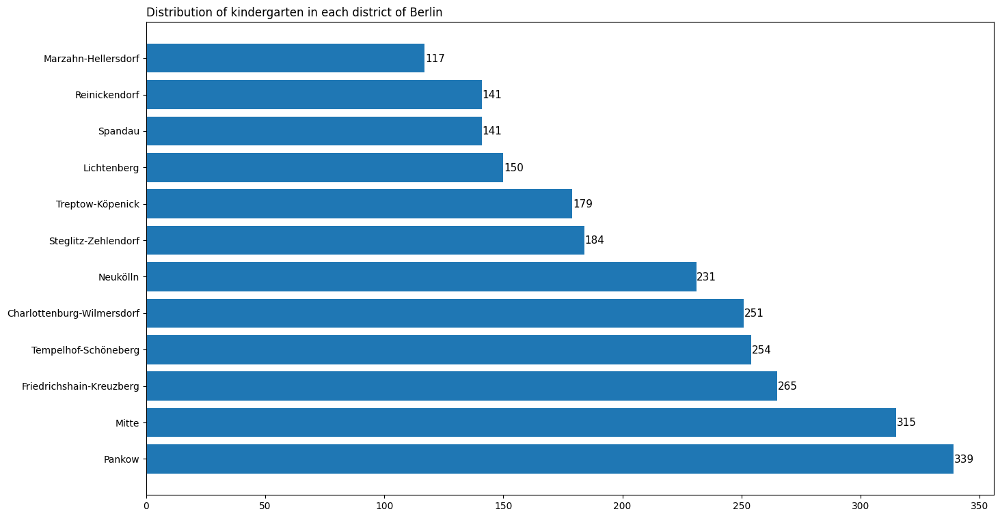

In [78]:
# Create a horizontal bar chart to visualize the distribution of nurseries in each district of Berlin
fig, ax = plt.subplots(figsize =(16, 9))
ax.barh(df_anzahl_kita['bezirk'], df_anzahl_kita['anzahl_kita'])
ax.invert_yaxis()
for i in ax.patches:
    plt.text(i.get_width()+0.2, i.get_y()+0.5,
             str(round((i.get_width()), 2)),
             fontsize = 11,
             color ='black')

ax.set_title('Distribution of kindergarten in each district of Berlin',
             loc ='left', )

plt.show()

In [75]:
# Categorize nurseries in Berlin into different size groups based on the number of available places.
# It calculates the count of nurseries in each size group, as well as the percentage they represent in the total number of kindergartens.
# The 'anzahl_plätze' column is used to determine the size category: 
#   - 'sehr klein' for up to 100 places,
#   - 'klein' for more than 100 and up to 200 places,
#   - 'mittel' for more than 200 and up to 300 places,
#   - 'groß' for over 300 places.
sql ="""
select case when anzahl_plätze <= 100 then 'sehr klein'
                when anzahl_plätze > 100 and anzahl_plätze  <= 200 then 'klein'
                when anzahl_plätze > 200 and anzahl_plätze  <= 300 then 'mittel'
           else 'groß'
           end as gruppe_plätze,
	   count(*) as anz_gruppe,
	   (count(*)/ sum(count(*)) over ())* 100 as anteile
from u577979.bln_kita_geo bkg
group by 1
order by 3 
"""

with engine.connect() as con:
        df_anz_gruppe = pd.read_sql_query(sql,con)
        
df_anz_gruppe

,gruppe_plätze,anz_gruppe,anteile
0,groß,3,0.116868
1,mittel,55,2.142579
2,klein,494,19.244254
3,sehr klein,2015,78.496299


In [63]:
# Calculate the number of nurseries for each nursery's type
sql ="""
select einrichtungsart as kitaart,
		count(*) as anz_kitaart,
		(count(*)/ sum(count(*)) over ())* 100 as anteile
		from u577979.bln_kita_geo bkg
group by 1
order by 2
"""

with engine.connect() as con:
        df_kitaart = pd.read_sql_query(sql,con)
        
df_kitaart

,kitaart,anz_kitaart,anteile
0,Waldkindergarten,3,0.116868
1,Eltern-Kind-Gruppe,24,0.934944
2,Eltern-Initiativ-Kindertagesstätte,570,22.204908
3,Kindertagesstätte,1970,76.743280


In [70]:
# Summarize the distribution of different associations among nurseries in Berlin
sql ="""
select trägerart,
		count(*) as anz_träger,
		(count(*)/ sum(count(*)) over ())* 100 as anteile
		from u577979.bln_kita_geo bkg
group by trägerart
order by trägerart
"""

with engine.connect() as con:
        df_trägerart = pd.read_sql_query(sql,con)
        
df_trägerart

,trägerart,anz_träger,anteile
0,Arbeiterwohlfahrt,39,1.519283
1,Betriebskita,3,0.116868
2,Deutscher Caritasverband,41,1.597195
3,Diakonisches Werk,216,8.414492
4,Eigenbetrieb,246,9.583171
5,EKT,508,19.789638
6,private Kita ohne Abschluss der Rahmenvereinba...,3,0.116868
7,Sonstiger freier Träger,1511,58.862485


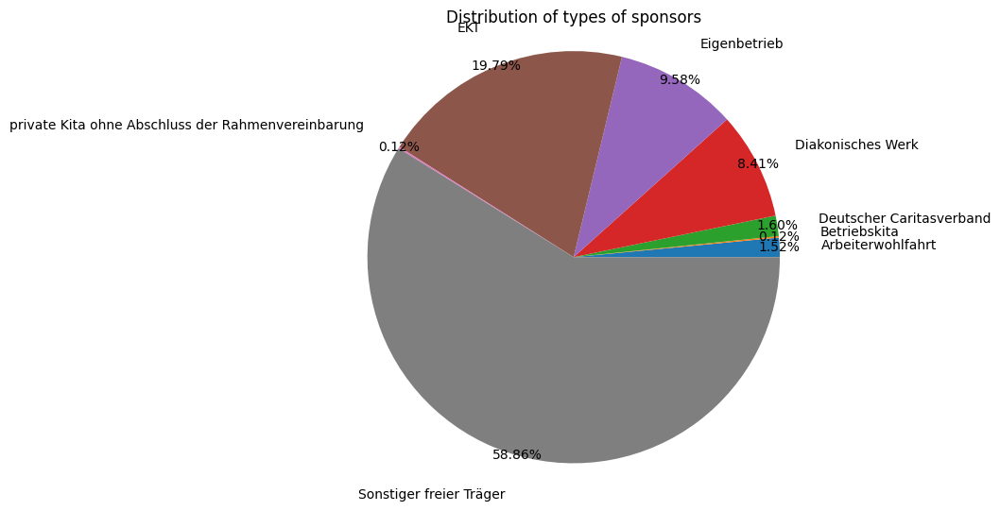

In [71]:
from matplotlib import pyplot as plt
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')
art = df_trägerart["trägerart"].to_list()
anzahl = df_trägerart["anz_träger"].to_list() 


ax.pie(anzahl, labels = art, autopct='%1.2f%%', pctdistance=1.0, labeldistance = 1.2)

plt.title('Distribution of types of sponsors')
plt.axis('equal')
plt.show()

# Visualize the geographical distribution of nurseries across different districts

In [31]:
# Initialize a geocoder to get the location of Berlin
locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
location = locator.geocode("Berlin")
print(location)

# Extract and store latitude and longitude of Berlin
location = [location.latitude, location.longitude]
print("[lat, long]:", location)

Berlin, Deutschland
[lat, long]: [52.5170365, 13.3888599]


In [32]:
# Prompt the user to enter their address
user_adresse = input("Enter your address: ")
user_location = locator.geocode(user_adresse)

Enter your adresse: Treskowallee 110, 10318 Berlin


'Treskowallee 110, 10318 Berlin'

In [33]:
# Extract and store latitude and longitude of the user's address
user_location = [user_location.latitude, user_location.longitude]
print(user_location)

[52.5170365, 13.3888599]


In [38]:
x, y = "latitude", "longitude"
size = "anzahl_plätze"
popup = "kita_name"
tooltip = ["min_distance", "haltestelle"]

# Copy the dataset to avoid modifying the original data
data = df_data.copy()

# Create a new "size" column with scaled values
scaler = preprocessing.MinMaxScaler(feature_range=(3, 15))
data["size"] = scaler.fit_transform(data[size].values.reshape(-1, 1)).reshape(-1)

# Initialize the map with the starting location (Berlin)
kita_map = folium.Map(location=location, tiles="openstreetmap", zoom_start=12)

# Add points for kindergartens with CircleMarker
data.apply(lambda row: folium.CircleMarker(
    location=[row[x], row[y]],
    popup=row[popup],
    tooltip=row[tooltip],
    fill=True,
    radius=row["size"]
).add_to(kita_map), axis=1)

# Add a red marker to show the user's location
folium.Marker(
    location=[user_location[0], user_location[1],
    icon=folium.Icon(color='red'),
    popup='You are here!'
).add_to(kita_map)

# Display the map
kita_map

# Cluster the nurseries with partition by gruppe_plätze (K-Means Algorithm)

In [39]:
sql ="""
with base1 as (
	select
	    bkg.einrichtungsname as kita_name,
		gotf."name" as haltestelle,
		st_distance(bkg.geometry, gotf.geometry) as min_distance
	from ugeobln.gis_osm_transport_free_1 gotf, u577979.bln_kita_geo bkg 
	),
	base2 as (
	select * from
    (select *,
        row_number() over(partition by kita_name order by min_distance asc ) as RowNum
     from base1
    ) A
    where RowNum = 1
	), 
	base3 as (
		select kita_name, betreuungsbezirk as bezirk, bkg.adresse, telefon, anzahl_plätze, 
	       case when anzahl_plätze <= 100 then 'sehr klein'
                when anzahl_plätze > 100 and anzahl_plätze  <= 200 then 'klein'
                when anzahl_plätze > 200 and anzahl_plätze  <= 300 then 'mittel'
           else 'groß'
           end as gruppe_plätze,
	       einrichtungsart as kita_art, trägername, 
	       trägerart, bkg.latitude, bkg.longitude , bkg.geometry as geom, min_distance, haltestelle
	from base2
	join u577979.bln_kita_geo bkg 
	on base2.kita_name = bkg.einrichtungsname
	)

    SELECT ST_ClusterKMeans(geom, 3) over (PARTITION BY gruppe_plätze) AS cid, kita_name, gruppe_plätze, anzahl_plätze, latitude, longitude
    FROM base3 ;
"""
with engine.connect() as con:
    df_cluster = pd.read_sql_query(sql, con)
    
df_cluster

,cid,kita_name,gruppe_plätze,anzahl_plätze,latitude,longitude
0,2,SoKi Heilpädagogische Kita Rominter Allee,groß,NaN,52.521506,13.246113
1,0,SoKi Cooperative Mensch eG,groß,NaN,52.419514,13.298899
2,1,BCS Kindergarten Preschool,groß,320.0,52.531416,13.389028
3,2,AWO Kita Sonnenblume,klein,130.0,52.548669,13.368956
4,0,Kindertagesstätte Villa Milla,klein,180.0,52.518688,13.496339
...,...,...,...,...,...,...
2562,0,Ev. Kita Frohnau,sehr klein,65.0,52.637942,13.289851
2563,2,Ev. Kita Galiläa,sehr klein,70.0,52.514919,13.473244
2564,0,Ev. Kita Grünes Dreieck,sehr klein,35.0,52.509297,13.224702
2565,0,Ev. Kita Gustav-Adolf,sehr klein,63.0,52.528841,13.304521


In [40]:
# Visualize the clusters on the map
x, y = "latitude", "longitude"
color = "cid"
size = "anzahl_plätze"
popup = "kita_name"

# Create a copy of the DataFrame for visualization
data = df_cluster.copy()

# Generate a list of unique elements in the 'color' column
lst_elements = sorted(list(data[color].unique()))

# Generate random colors for each unique element
lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for _ in range(len(lst_elements))]

# Map the unique elements to corresponding colors
data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

# Scale the 'size' column to control marker size
scaler = preprocessing.MinMaxScaler(feature_range=(3, 15))
data["size"] = scaler.fit_transform(data[size].values.reshape(-1, 1)).reshape(-1)

# Initialize the map with the starting location and open street map tiles
map_cluster = folium.Map(location=location, tiles="openstreetmap", zoom_start=11)

# Add circle markers for each data point
data.apply(lambda row: folium.CircleMarker(
    location=[row[x], row[y]],
    popup=row[popup],
    color=row["color"],
    fill=True,
    radius=row["size"]
).add_to(map_cluster), axis=1)

# Create an HTML legend for the map
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>""" + color + """:</b><br>"""
for i in lst_elements:
    legend_html = legend_html + """&nbsp;<i class="fa fa-circle fa-1x" style="color:""" + lst_colors[lst_elements.index(i)] + """"></i>&nbsp;""" + str(i) + """<br>"""
legend_html = legend_html + """</div>"""
map_cluster.get_root().html.add_child(folium.Element(legend_html))

# Display the map
map_cluster

# Cluster the nurseries without partition by gruppe_plätze (K-Means Algorithm)

In [41]:
sql ="""
with base1 as (
	select
	    bkg.einrichtungsname as kita_name,
		gotf."name" as haltestelle,
		st_distance(bkg.geometry, gotf.geometry) as min_distance
	from ugeobln.gis_osm_transport_free_1 gotf, u577979.bln_kita_geo bkg 
	),
	base2 as (
	select * from
    (select *,
        row_number() over(partition by kita_name order by min_distance asc ) as RowNum
     from base1
    ) A
    where RowNum = 1
	), 
	base3 as (
		select kita_name, betreuungsbezirk as bezirk, bkg.adresse, telefon, anzahl_plätze, 
	       case when anzahl_plätze <= 100 then 'sehr klein'
                when anzahl_plätze > 100 and anzahl_plätze  <= 200 then 'klein'
                when anzahl_plätze > 200 and anzahl_plätze  <= 300 then 'mittel'
           else 'groß'
           end as gruppe_plätze,
	       einrichtungsart as kita_art, trägername, 
	       trägerart, bkg.latitude, bkg.longitude , bkg.geometry as geom, min_distance, haltestelle
	from base2
	join u577979.bln_kita_geo bkg 
	on base2.kita_name = bkg.einrichtungsname
	)

    SELECT ST_ClusterKMeans(geom, 3) over () AS cid, kita_name, gruppe_plätze, anzahl_plätze, latitude, longitude
    FROM base3 ;
"""
with engine.connect() as con:
    df_cluster1 = pd.read_sql_query(sql, con)
    
df_cluster1

,cid,kita_name,gruppe_plätze,anzahl_plätze,latitude,longitude
0,2,2. Kita Pretty World,sehr klein,45.0,52.489328,13.454800
1,2,ABC-Hamster (nur Sprachförderung),sehr klein,15.0,52.566519,13.345095
2,1,ABC Kindergarten,sehr klein,25.0,52.481846,13.517110
3,0,ABC-Kindergarten Birgit Döbler,sehr klein,25.0,52.498942,13.301852
4,2,Alegria Kiga,sehr klein,48.0,52.512154,13.390353
...,...,...,...,...,...,...
2562,0,Zehlendorfer Teddys,sehr klein,75.0,52.416960,13.265272
2563,0,Zehlendorfer Teddys Sachtlebenstr.,sehr klein,50.0,52.417206,13.250639
2564,2,Zions-Kindergarten,sehr klein,85.0,52.536083,13.405401
2565,2,Zwergenparadies,klein,130.0,52.528183,13.481894


In [42]:
x, y = "latitude", "longitude"
color = "cid"
size = "anzahl_plätze"
popup = "kita_name"

# Create a copy of the data for mapping
data = df_cluster1.copy()

# Generate random colors for each unique value in the 'color' column
lst_elements = sorted(list(data[color].unique()))
lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in range(len(lst_elements))]
data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

# Scale the 'size' column for marker radii
scaler = preprocessing.MinMaxScaler(feature_range=(3, 15))
data["size"] = scaler.fit_transform(data[size].values.reshape(-1, 1)).reshape(-1)

# Initialize the Folium map with the starting location and zoom level
map_cluster1 = folium.Map(location=location, tiles="openstreetmap", zoom_start=11)

# Add data points as circular markers to the map
data.apply(lambda row: folium.CircleMarker(
    location=[row[x], row[y]],
    popup=row[popup],
    color=row["color"],
    fill=True,
    radius=row["size"]
).add_to(map_cluster1), axis=1)

# Create an HTML legend to display the color codes and their corresponding values
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
    legend_html = legend_html + """&nbsp;<i class="fa fa-circle fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+""""></i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html + """</div>"""

# Add the legend to the map
map_cluster1.get_root().html.add_child(folium.Element(legend_html))

# Display the map with markers and the legend
map_cluster1

# Cluster the nurseries using K-Means Algorithm in Python

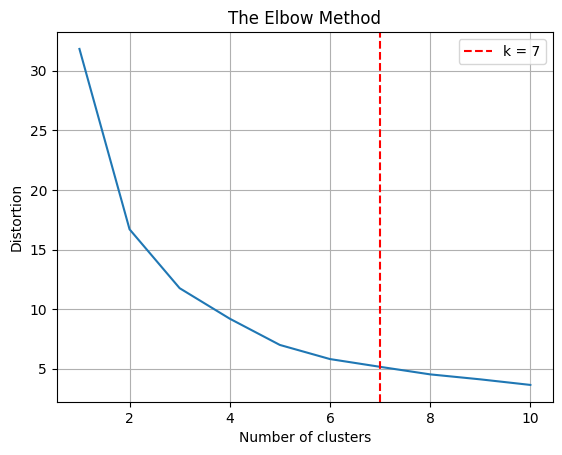

In [81]:
# Select the latitude and longitude columns from the DataFrame
X = df_data[["latitude", "longitude"]]

# Define the maximum number of clusters (k) to consider
max_k = 10

# Create an empty list to store the distortion values for each k
distortions = []

# Iterate through different values of k
for i in range(1, max_k + 1):
    # Check if there are enough data points to form 'i' clusters
    if len(X) >= i:
        # Initialize a KMeans model with 'i' clusters and fit it to the data
        model = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
        model.fit(X)
        
        # Append the distortion (inertia) to the list
        distortions.append(model.inertia_)
        
# Calculate the 'elbow' point where the rate of decrease in distortion slows down
# This helps identify the optimal number of clusters
k = [i * 100 for i in np.diff(distortions, 2)].index(min([i * 100 for i in np.diff(distortions, 2)]))

# Create a plot to visualize the Elbow Method results
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions) + 1), distortions)
ax.axvline(k, ls='--', color="red", label="k = " + str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', ylabel="Distortion")
ax.legend()
ax.grid(True)

# Display the plot
plt.show()

In [85]:
# Define the number of clusters (k)
k = 7

# Initialize the K-Means clustering model with 'k' clusters and using 'k-means++' initialization
model = KMeans(n_clusters=k, init='k-means++')

# Extract the latitude and longitude columns from the DataFrame 'df_data'
X = df_data[["latitude", "longitude"]]

# Create a copy of the data for clustering
dtf_X = X.copy()

# Perform clustering and assign cluster labels to each data point
dtf_X["cluster"] = model.fit_predict(X)

# Find the real centroids of the clusters
closest, distances = vq(model.cluster_centers_, dtf_X.drop("cluster", axis=1).values)

# Create a binary column 'centroids' to indicate if a data point is a centroid
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1

# Add the cluster and centroids information back to the original dataset 'df_data'
df_data[["cluster", "centroids"]] = dtf_X[["cluster", "centroids"]]

# The updated 'df_data' now contains cluster labels and information about centroids
df_data


/var/folders/g7/_7lrm4c52tv5blzcl14q7p_80000gn/T/ipykernel_1084/4196967901.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtf_X["centroids"].iloc[i] = 1
/var/folders/g7/_7lrm4c52tv5blzcl14q7p_80000gn/T/ipykernel_1084/4196967901.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_data[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]


,kita_name,bezirk,adresse,telefon,anzahl_plätze,gruppe_plätze,kitaart,trägername,trägerart,latitude,longitude,min_distance,haltestelle,cluster,centroids
0,2. Kita Pretty World,Treptow-Köpenick,"Elsenstr. 102A, 12435, Berlin",3064076923,45.0,sehr klein,Kindertagesstätte,Pretty World gGmbH,Sonstiger freier Träger,52.489328,13.454800,0.001634,Elsenstraße/Kiefholzstraße,6,0
1,ABC-Hamster (nur Sprachförderung),Reinickendorf,"Winterthurstr. 007, 13407, Berlin",,15.0,sehr klein,Kindertagesstätte,Netzwerk Bethanien e.V.,Sonstiger freier Träger,52.566519,13.345095,0.001961,Gotthardstraße/Teichstraße,5,0
2,ABC Kindergarten,Lichtenberg,"Liepnitzstr. 049, 10318, Berlin",50154228,25.0,sehr klein,Kindertagesstätte,ABC Kindergarten gUG (haftungsbeschränkt),Sonstiger freier Träger,52.481846,13.517110,0.000514,Stechlinstraße,3,0
3,ABC-Kindergarten Birgit Döbler,Charlottenburg-Wilmersdorf,"Cicerostr. 063, 10709, Berlin",8913331,25.0,sehr klein,Kindertagesstätte,ABC Kindergarten gUG (haftungsbeschränkt),Sonstiger freier Träger,52.498942,13.301852,0.000344,Lehniner Platz/Schaubühne,2,0
4,Alegria Kiga,Mitte,"Mohrenstr. 011, 10117, Berlin",030 51055655,48.0,sehr klein,Kindertagesstätte,Alegria Kiga gGmbH,Sonstiger freier Träger,52.512154,13.390353,0.000210,U Stadtmitte (U2),0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2562,Zehlendorfer Teddys,Steglitz-Zehlendorf,"Teltower Damm 188, 14167, Berlin",3022326082,75.0,sehr klein,Kindertagesstätte,GKJ-Berlin gemeinnützige Gesellschaft für Kind...,Sonstiger freier Träger,52.416960,13.265272,0.001663,Am Birkenknick,2,0
2563,Zehlendorfer Teddys Sachtlebenstr.,Steglitz-Zehlendorf,"Sachtlebenstr. 012, 14165, Berlin",3026077742,50.0,sehr klein,Kindertagesstätte,GKJ-Berlin gemeinnützige Gesellschaft für Kind...,Sonstiger freier Träger,52.417206,13.250639,0.001160,Ludwigsfelder Straße/Sachtlebenstraße,2,0
2564,Zions-Kindergarten,Mitte,"Griebenowstr. 016, 10435, Berlin",449 04 16,85.0,sehr klein,Kindertagesstätte,Ev. Kirchenkreisverband für Kindertageseinrich...,Diakonisches Werk,52.536083,13.405401,0.001587,Zionskirchplatz,0,0
2565,Zwergenparadies,Lichtenberg,"Bernhard-Bästlein-Str. 044, 10367, Berlin",97603447,130.0,klein,Kindertagesstätte,Kindergärten NordOst,Eigenbetrieb,52.528183,13.481894,0.001451,Bernhard-Bästlein-Straße,4,0


In [86]:
x, y = "latitude", "longitude"
color = "cluster"
size = "anzahl_plätze"
popup = "kita_name"
marker = "centroids"

# Create a copy of the DataFrame for data manipulation
data = df_data.copy()

# Create a color column based on unique values in the 'cluster' column
lst_elements = sorted(list(df_data[color].unique()))
lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in range(len(lst_elements))]
data["color"] = data[color].apply(lambda x: lst_colors[lst_elements.index(x)])

# Create a scaled size column
scaler = preprocessing.MinMaxScaler(feature_range=(3, 15))
data["size"] = scaler.fit_transform(data[size].values.reshape(-1, 1)).reshape(-1)

# Initialize a folium map with the starting location
bln_map1 = folium.Map(location=location, tiles="openstreetmap", zoom_start=11)

# Add circle markers to the map for each data point
data.apply(lambda row: folium.CircleMarker(
    location=[row[x], row[y]], popup=row[popup],
    color=row["color"], fill=True,
    radius=row["size"]).add_to(bln_map1), axis=1)

# Add an HTML legend to the map
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>""" + color + """:</b><br>"""
for i in lst_elements:
    legend_html = legend_html + """&nbsp;<i class="fa fa-circle fa-1x" style="color:""" + lst_colors[lst_elements.index(i)] + """">
    </i>&nbsp;""" + str(i) + """<br>"""
legend_html = legend_html + """</div>"""
bln_map1.get_root().html.add_child(folium.Element(legend_html))

# Add markers for centroids (if 'centroids' column is available)
if marker in df_data.columns:
    lst_elements = sorted(list(df_data[marker].unique()))
    data[data[marker] == 1].apply(lambda row:
                                  folium.Marker(location=[row[x], row[y],
                                                      popup=row[marker], draggable=False,
                                                      icon=folium.Icon(color="black")).add_to(bln_map1), axis=1)

# Display the map
bln_map1